# Bitcoin Sentiment Analysis

### Exploring and cleaning the data

In [2]:
# Import libraries
import numpy as np
import pandas as pd
from datetime import datetime

#NLP libraries 
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from textblob import TextBlob

In [3]:
df=pd.read_csv("Bitcoin_tweets.csv")
df.shape

C:\Users\Abel_\AppData\Local\Temp\ipykernel_2712\3117999186.py:1: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv("Bitcoin_tweets.csv")


(95762468, 13)

In [4]:
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,DeSota Wilson,"Atlanta, GA","Biz Consultant, real estate, fintech, startups...",2009-04-26 20:05:09,8534.0,7605,4838,False,2021-02-10 23:59:04,Blue Ridge Bank shares halted by NYSE after #b...,['bitcoin'],Twitter Web App,False
1,CryptoND,NaN,😎 BITCOINLIVE is a Dutch platform aimed at inf...,2019-10-17 20:12:10,6769.0,1532,25483,False,2021-02-10 23:58:48,"😎 Today, that's this #Thursday, we will do a ""...","['Thursday', 'Btc', 'wallet', 'security']",Twitter for Android,False
2,Tdlmatias,"London, England","IM Academy : The best #forex, #SelfEducation, ...",2014-11-10 10:50:37,128.0,332,924,False,2021-02-10 23:54:48,"Guys evening, I have read this article about B...",NaN,Twitter Web App,False
3,Crypto is the future,NaN,I will post a lot of buying signals for BTC tr...,2019-09-28 16:48:12,625.0,129,14,False,2021-02-10 23:54:33,$BTC A big chance in a billion! Price: \487264...,"['Bitcoin', 'FX', 'BTC', 'crypto']",dlvr.it,False
4,Alex Kirchmaier 🇦🇹🇸🇪 #FactsSuperspreader,Europa,Co-founder @RENJERJerky | Forbes 30Under30 | I...,2016-02-03 13:15:55,1249.0,1472,10482,False,2021-02-10 23:54:06,This network is secured by 9 508 nodes as of t...,['BTC'],Twitter Web App,False


In [5]:
df.tail()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
95762463,TAnotepad,Not financial advice,#Bitcoin | Forever Alone Crypto Trader 😭 | Ana...,2022-11-04 10:18:11,674.0,1789.0,27466.0,False,2023-01-06 17:46:35,"Bitcoin squeeze is SUPER TIGHT, which way will...","['BTC', 'bitcoin', 'Crypto', 'cryptocurrency',...",Twitter for Android,False
95762464,Boba-Feh,South of the North Pole,My backpack has jets. Reformed Necromonger,2008-04-02 21:48:47,79.0,454.0,125.0,False,2023-01-06 17:46:29,Closed #BTC short at 16725. Missed my long pla...,['BTC'],Twitter for Android,False
95762465,Ethereum Yoda,NaN,UP or DOWN...\n.\n.\n.\n.\nPrice matters NOT.,2022-07-24 04:50:18,532.0,1.0,0.0,False,2023-01-06 17:46:22,#Ethereum price update: \n\n#ETH $1263.59 USD\...,"['Ethereum', 'ETH', 'Bitcoin', 'BTC', 'altcoin...",Twitter Web App,False
95762466,Bitcoin Price Ticker,NaN,Tweets the current price of #bitcoin every 5 m...,2022-10-20 07:10:38,83.0,7.0,9.0,False,2023-01-06 17:46:20,1₿ = $16814.7 -0.07%🔻\n\nDetails:\nChange: 🔻-1...,"['bitcoin', 'btc']",BitcoinLivePriceTicker,False
95762467,faucetojisan,NaN,💰faucetpay 👉\nhttps://t.co/eHqMw9QdFx\n\n💰betf...,2022-10-13 05:41:53,14.0,10.0,0.0,False,2023-01-06 17:46:17,Earn crypto by playing fun games online.\nGet ...,"['faucet', 'cointiply', 'BTC']",Twitter for Android,False


###### The only columns that are relevant for the current analysis are the ones that contain the text and the date .

In [6]:
df = df[['date', 'text']]
df.isnull().sum()

date    91073114
text    91073114
dtype: int64

In [7]:
df

,date,text
0,2021-02-10 23:59:04,Blue Ridge Bank shares halted by NYSE after #b...
1,2021-02-10 23:58:48,"😎 Today, that's this #Thursday, we will do a ""..."
2,2021-02-10 23:54:48,"Guys evening, I have read this article about B..."
3,2021-02-10 23:54:33,$BTC A big chance in a billion! Price: \487264...
4,2021-02-10 23:54:06,This network is secured by 9 508 nodes as of t...
...,...,...
95762463,2023-01-06 17:46:35,"Bitcoin squeeze is SUPER TIGHT, which way will..."
95762464,2023-01-06 17:46:29,Closed #BTC short at 16725. Missed my long pla...
95762465,2023-01-06 17:46:22,#Ethereum price update: \n\n#ETH $1263.59 USD\...
95762466,2023-01-06 17:46:20,1₿ = $16814.7 -0.07%🔻\n\nDetails:\nChange: 🔻-1...


###### There cannot be null values in the date and text columns. Let's drop those rows.

In [8]:
df.dropna(axis=0 ,subset=['date','text'],inplace = True)
df.reset_index(drop= True,inplace=True)
df.shape

(4689354, 2)

In [9]:
df.dtypes

date    object
text    object
dtype: object

In [10]:
df = df.convert_dtypes()
df.dtypes

date    string[python]
text    string[python]
dtype: object

In [11]:
#Check which of the rows don't have a date in the 'date' column to turn
def validate(date_text):
    errors = []
    for i,v in enumerate(date_text):
        try:
            datetime.strptime(v, '%Y-%m-%d %H:%M:%S')
        except ValueError:
            errors.append(i)
    return errors

In [12]:
errors = validate(df['date'])
print(f'There are {len(errors)} non-date values that need to be dropped')

There are 66 non-date values that need to be dropped


In [13]:
#Let's drop this non-date values
df_clean = df.loc[~df.index.isin(errors)]
df_clean.reset_index(drop=True,inplace=True)
df_clean

,date,text
0,2021-02-10 23:59:04,Blue Ridge Bank shares halted by NYSE after #b...
1,2021-02-10 23:58:48,"😎 Today, that's this #Thursday, we will do a ""..."
2,2021-02-10 23:54:48,"Guys evening, I have read this article about B..."
3,2021-02-10 23:54:33,$BTC A big chance in a billion! Price: \487264...
4,2021-02-10 23:54:06,This network is secured by 9 508 nodes as of t...
...,...,...
4689283,2023-01-06 17:46:35,"Bitcoin squeeze is SUPER TIGHT, which way will..."
4689284,2023-01-06 17:46:29,Closed #BTC short at 16725. Missed my long pla...
4689285,2023-01-06 17:46:22,#Ethereum price update: #ETH $1263.59 USD #B...
4689286,2023-01-06 17:46:20,1₿ = $16814.7 -0.07%🔻 Details: Change: 🔻-12.0...


In [14]:
#Save it to a .csv file for security
df_clean.to_csv("btc_tweets_clean.csv", index=False)

### NLP and Clustering to detect fraud/Scam related tweets

In [15]:
#Importing the necessary libraries
import nltk
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.cluster import KMeans
from sklearn import cluster
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import string
import re
import matplotlib.pyplot as plt

##### Tokenization, lemmatization and stopword removal

In [16]:
#Tokenization function
def tokenize_tweets(tweet):
    tweet = tweet.lower()  # Convert to lower case
    tweet = re.sub(r'\d+', '', tweet)  # Remove numbers
    tweet = re.sub(r'[^\w\s]', '', tweet)  # Remove punctuation
    tweet = re.sub(r'http\S+', '', tweet)  # Remove URLs
    tweet = re.sub(r'@\w+', '', tweet)  # Remove mentions
    tweet = re.sub(r'#[\w-]+', '', tweet)  # Remove hashtags
    tweet = re.sub('[^A-Za-z]+', ' ', tweet)  # Keep only alphabetic characters
    tokens = word_tokenize(tweet)  # Tokenize
    tokens = [word for word in tokens if word.isalpha()]  # Remove non-alphabetic tokens
    return tokens

In [17]:
#Lemmatization function
def lemmatize_tweets(tokens):
    lemmatizer = WordNetLemmatizer()
    return [lemmatizer.lemmatize(token) for token in tokens]

In [18]:
#Stopwords removal function
def remove_stopwords(tokens):
    stop_words = set(stopwords.words('english'))
    return [token for token in tokens if token not in stop_words]

In [19]:
#putting all together
def clean_tweet(tweet):
    tokens = tokenize_tweets(tweet)
    tokens = lemmatize_tweets(tokens)
    clean_tokens = remove_stopwords(tokens)
    return ' '.join(clean_tokens)

In [43]:
%%time

# Applying the function and exploring the result
df_clean['clean_text'] = df_clean['text'].apply(clean_tweet)
df_clean

CPU times: total: 20min 35s
Wall time: 31min 26s


<timed exec>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,date,text,clean_text
0,2021-02-10 23:59:04,Blue Ridge Bank shares halted by NYSE after #b...,blue ridge bank share halted nyse bitcoin atm ...
1,2021-02-10 23:58:48,"😎 Today, that's this #Thursday, we will do a ""...",today thats thursday take friend leowandersleb...
2,2021-02-10 23:54:48,"Guys evening, I have read this article about B...",guy evening read article btc would like share
3,2021-02-10 23:54:33,$BTC A big chance in a billion! Price: \487264...,btc big chance billion price bitcoin fx btc cr...
4,2021-02-10 23:54:06,This network is secured by 9 508 nodes as of t...,network secured node today soon biggest bear r...
...,...,...,...
4689283,2023-01-06 17:46:35,"Bitcoin squeeze is SUPER TIGHT, which way will...",bitcoin squeeze super tight way break bullish ...
4689284,2023-01-06 17:46:29,Closed #BTC short at 16725. Missed my long pla...,closed btc short missed long place hair wait s...
4689285,2023-01-06 17:46:22,#Ethereum price update: #ETH $1263.59 USD #B...,ethereum price update eth usd bitcoin btc foll...
4689286,2023-01-06 17:46:20,1₿ = $16814.7 -0.07%🔻 Details: Change: 🔻-12.0...,detail change h low h high bitcoin btc


###### Feature Extraction

In [44]:
%%time

vectorizer = CountVectorizer(max_features=10000)
X = vectorizer.fit_transform(df_clean['clean_text']) 

CPU times: total: 43.8 s
Wall time: 50.8 s


In [45]:
X.shape

(4689288, 10000)

###### K-means clustering

In [46]:
kmeans = cluster.KMeans(n_clusters=30,random_state=42)
kmeans.fit(X)
pred = kmeans.predict(X)

C:\Users\Abel_\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [47]:
predict_df = pd.concat([df_clean, pd.DataFrame(pred,columns=['class'])],axis=1)
predict_df

,date,text,clean_text,class
0,2021-02-10 23:59:04,Blue Ridge Bank shares halted by NYSE after #b...,blue ridge bank share halted nyse bitcoin atm ...,27
1,2021-02-10 23:58:48,"😎 Today, that's this #Thursday, we will do a ""...",today thats thursday take friend leowandersleb...,0
2,2021-02-10 23:54:48,"Guys evening, I have read this article about B...",guy evening read article btc would like share,0
3,2021-02-10 23:54:33,$BTC A big chance in a billion! Price: \487264...,btc big chance billion price bitcoin fx btc cr...,29
4,2021-02-10 23:54:06,This network is secured by 9 508 nodes as of t...,network secured node today soon biggest bear r...,0
...,...,...,...,...
4689283,2023-01-06 17:46:35,"Bitcoin squeeze is SUPER TIGHT, which way will...",bitcoin squeeze super tight way break bullish ...,12
4689284,2023-01-06 17:46:29,Closed #BTC short at 16725. Missed my long pla...,closed btc short missed long place hair wait s...,0
4689285,2023-01-06 17:46:22,#Ethereum price update: #ETH $1263.59 USD #B...,ethereum price update eth usd bitcoin btc foll...,21
4689286,2023-01-06 17:46:20,1₿ = $16814.7 -0.07%🔻 Details: Change: 🔻-12.0...,detail change h low h high bitcoin btc,27


In [48]:
predict_df.to_csv("predict_df.csv", index=False)

In [62]:
#Quick exploration of the clusters

In [65]:
print (predict_df.iloc[147]['text'])
print (predict_df.iloc[147]['clean_text']) 

@zerohedge -
It's okay - Tesla's new business model is #crypto promotion.

https://t.co/MUuN6DyJkX #btc $btc #bitcoin $gold $silver
zerohedge okay tesla new business model crypto promotion btc btc bitcoin gold silver


In [66]:
row_147147 = predict_df.iloc[147147]
cluster_2 = predict_df[predict_df['class'] == 2]
print (row_147147)
cluster_2

date                                        2021-06-23 08:38:22
text          I think this #Bitcoin correction is done. I wa...
clean_text    think bitcoin correction done warned earlier y...
class                                                        27
Name: 147147, dtype: object


,date,text,clean_text,class
3543685,2022-06-15 23:58:30,#Bitcoin Last Price $22572 #BTC 🚀 Daily Indica...,bitcoin last price btc daily indicator variati...,2
3543724,2022-06-15 23:55:30,#Bitcoin Last Price $22490 #BTC 🚀 Daily Indica...,bitcoin last price btc daily indicator variati...,2
3543762,2022-06-15 23:52:30,#Bitcoin Last Price $22506 #BTC 🚀 Daily Indica...,bitcoin last price btc daily indicator variati...,2
3543815,2022-06-15 23:49:30,#Bitcoin Last Price $22537 #BTC 🚀 Daily Indica...,bitcoin last price btc daily indicator variati...,2
3543876,2022-06-15 23:46:29,#Bitcoin Last Price $22485 #BTC 🚀 Daily Indica...,bitcoin last price btc daily indicator variati...,2
...,...,...,...,...
4688935,2023-01-06 18:11:14,#Bitcoin Last Price $16848 #BTC 🚀 Daily Indica...,bitcoin last price btc daily indicator change ...,2
4689046,2023-01-06 18:03:01,#Bitcoin Last Price $16837 #BTC 🚀 Weekly Indic...,bitcoin last price btc weekly indicator change...,2
4689078,2023-01-06 18:01:00,#Bitcoin Last Price $16819 #BTC 🚀 Daily Indica...,bitcoin last price btc daily indicator change ...,2
4689207,2023-01-06 17:52:46,#Bitcoin Last Price $16816 #BTC 🚀 Weekly Indic...,bitcoin last price btc weekly indicator change...,2


In [64]:
predict_df['clean_text']

0          blue ridge bank share halted nyse bitcoin atm ...
1          today thats thursday take friend leowandersleb...
2              guy evening read article btc would like share
3          btc big chance billion price bitcoin fx btc cr...
4          network secured node today soon biggest bear r...
                                 ...                        
4689283    bitcoin squeeze super tight way break bullish ...
4689284    closed btc short missed long place hair wait s...
4689285    ethereum price update eth usd bitcoin btc foll...
4689286               detail change h low h high bitcoin btc
4689287    earn crypto playing fun game online get reward...
Name: clean_text, Length: 4689288, dtype: object

###### Now, let's take a closer and more visual look to these clusters

In [67]:
!pip install wordcloud
from wordcloud import WordCloud

   ---------------------------------------- 0.0/300.2 kB ? eta -:--:--
   ---- ----------------------------------- 30.7/300.2 kB 1.4 MB/s eta 0:00:01
   ------------------------------- -------- 235.5/300.2 kB 2.9 MB/s eta 0:00:01
   ---------------------------------------- 300.2/300.2 kB 3.7 MB/s eta 0:00:00


In [68]:
## Function to create a word cloud for each cluster
def create_word_clouds(df, num_clusters):
    for i in range(num_clusters):
        cluster_text = ' '.join(df[df['class'] == i]['clean_text'].astype(str))
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(cluster_text)
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Word Cloud for Cluster {i}')
        plt.show()



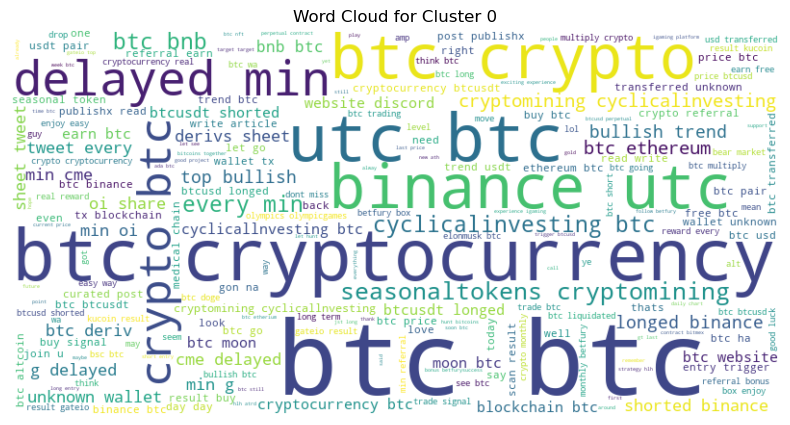

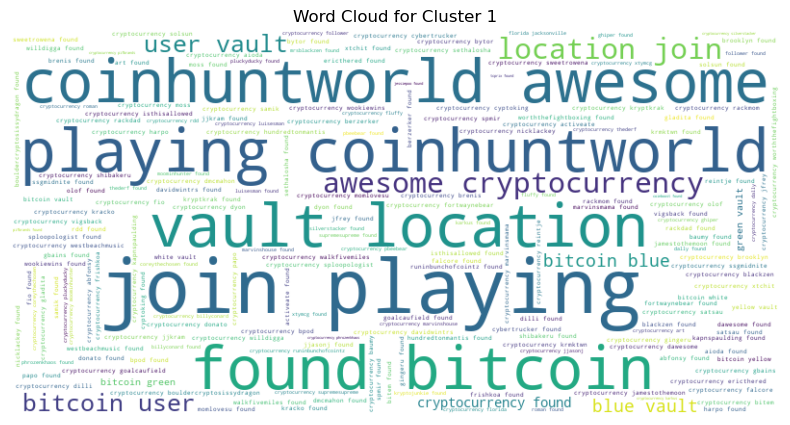

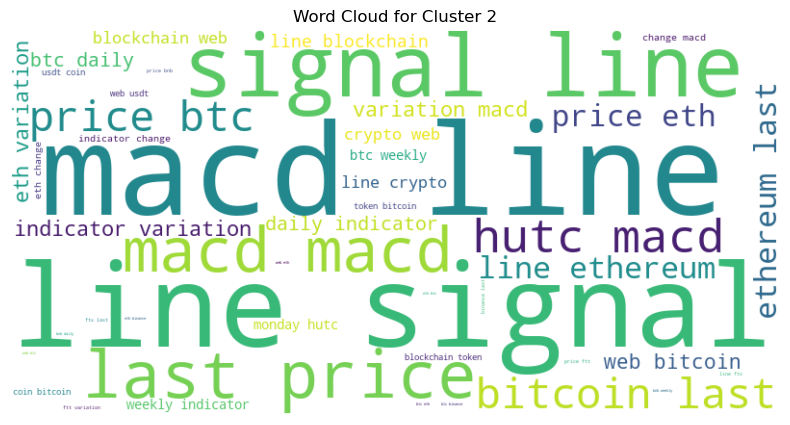

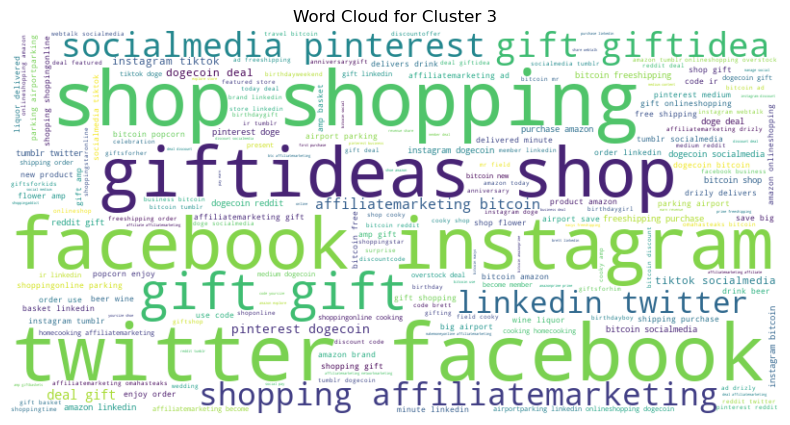

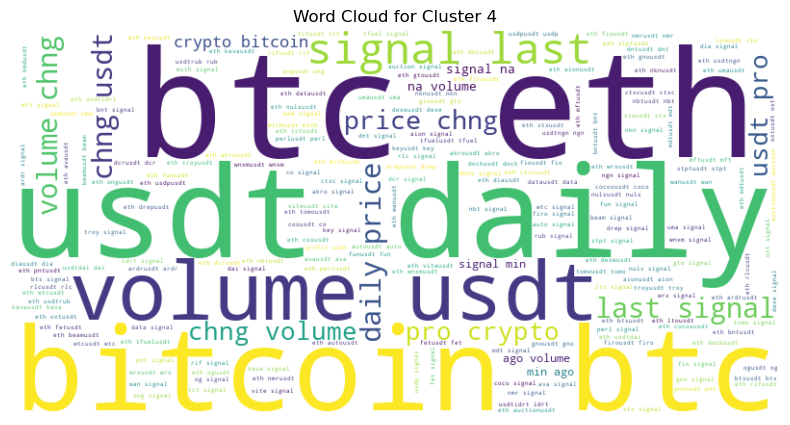

...

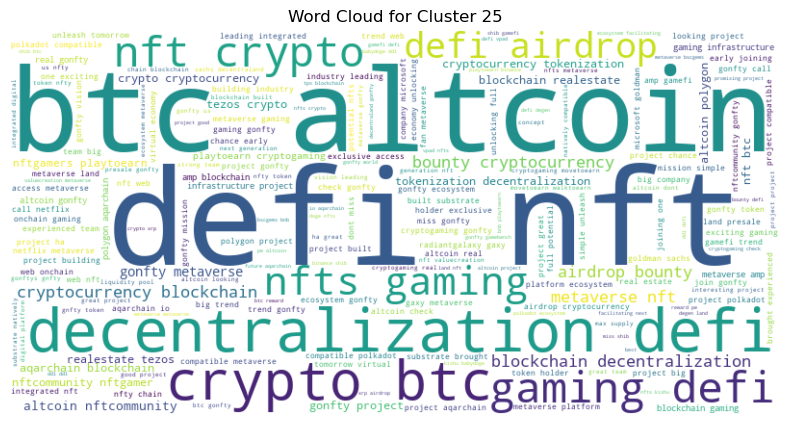

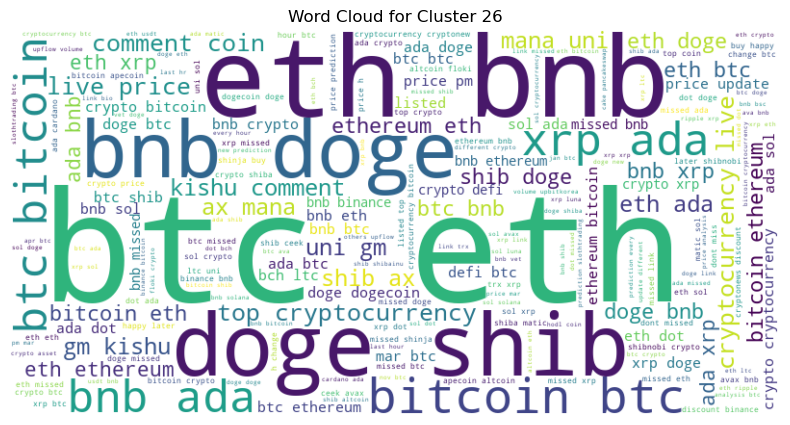

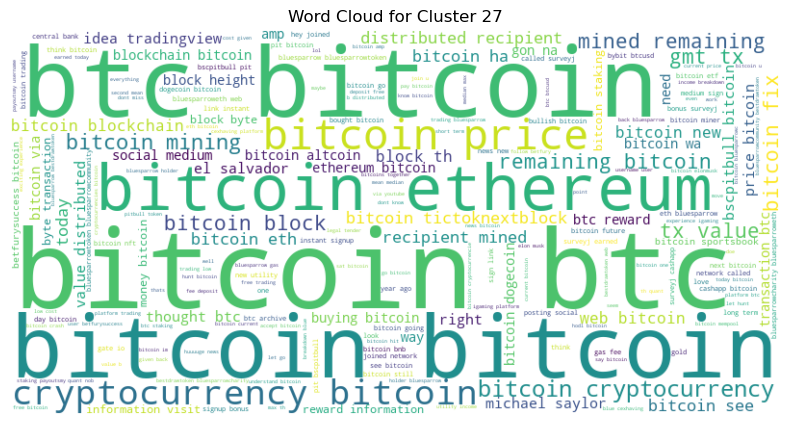

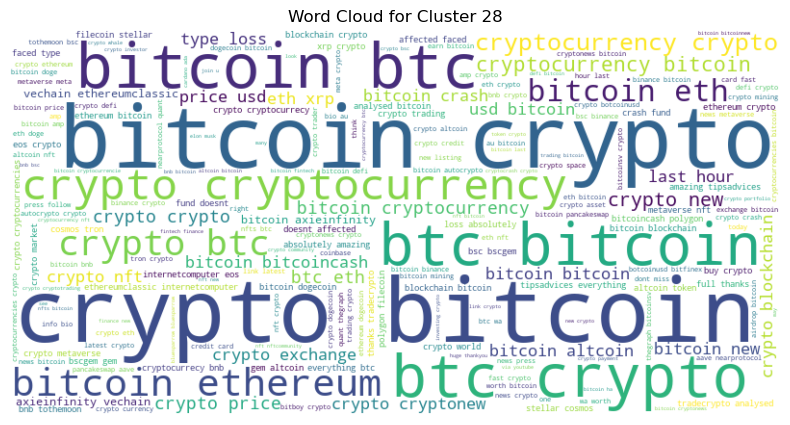

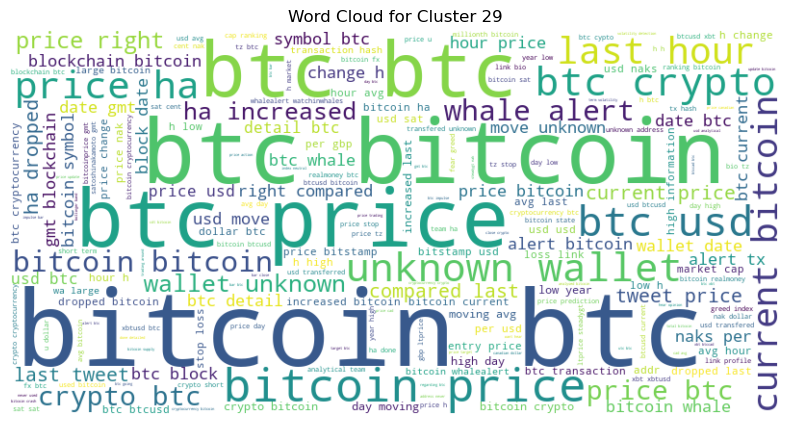

In [69]:
# Create word clouds for each cluster
create_word_clouds(predict_df, 30)

###### Analyzing clusters to DISCARD the ones that are NOT RELEVANT (including scam)

     Cluster  0: RELEVANT. Seems to be focused on trading.
     Cluster  1: Not relevant. Gaming and cryptogaming.
     Cluster  2: RELEVANT. Bitcoin trading.
     Cluster  3: Not relevant. shopping and social media
     Cluster  4: RELEVANT. Trading and bitcoin-related vocabulary
     Cluster  5: Not relevant. Focus on NFTs and giveaways.
     Cluster  6: RELEVANT. Trading terms.
     Cluster  7: RELEVANT. Block size and bitcoin terms.
     Cluster  8: RELEVANT. General crypto and btc talk.
     Cluster  9: Not relevant.
     Cluster 10: RELEVANT. General cryptocurrency words.
     Cluster 11: Not relevant. Probably SCAM, a lot of "airdrops".
     Cluster 12: RELEVANT. Btc, and and other cryptocurrency-related words
     Cluster 13: RELEVANT. 
     Cluster 14: Not relevant. Promotional or "scammy" words.
     Cluster 15: RELEVANT.Trading related words.
     Cluster 16: RELEVANT. Vocabulary highly related to sentiment
     Cluster 17: Not relevant. Scam-related words
     Cluster 18: RELEVANT. Mostly trading advice.
     Cluster 19: RELEVANT. Trading.
     Cluster 20: Not relevant. Scam words and unrelated words.
     Cluster 21: RELEVANT. Focuses on price and market updates.
     Cluster 22: Not relevant. Centered on giveaways.
     Cluster 23: Not relevant. More related to NFTs than Bitcoin sentiment.
     Cluster 24: RELEVANT. Market sentiment indicators
     Cluster 25: Not relevant. Defi and gaming focus.
     Cluster 26: Not relevant. Dominated by "altcoins".
     Cluster 27: RELEVANT. Bitcoin related words.
     Cluster 28: RELEVANT. General focus on price changes.
     Cluster 29: RELEVANT. terms related to market movements.

###### We are dropping these twelve non-relevant clusters: 
###### 1, 3, 5, 9, 11, 14, 17, 20, 22, 23, 25, 26

In [70]:
clusters_to_drop = [1, 3, 5, 9, 11, 14, 17, 20, 22, 23, 25, 26]
df_bitcoin= predict_df[~predict_df['class'].isin(clusters_to_drop)]
df_bitcoin

,date,text,clean_text,class
0,2021-02-10 23:59:04,Blue Ridge Bank shares halted by NYSE after #b...,blue ridge bank share halted nyse bitcoin atm ...,27
1,2021-02-10 23:58:48,"😎 Today, that's this #Thursday, we will do a ""...",today thats thursday take friend leowandersleb...,0
2,2021-02-10 23:54:48,"Guys evening, I have read this article about B...",guy evening read article btc would like share,0
3,2021-02-10 23:54:33,$BTC A big chance in a billion! Price: \487264...,btc big chance billion price bitcoin fx btc cr...,29
4,2021-02-10 23:54:06,This network is secured by 9 508 nodes as of t...,network secured node today soon biggest bear r...,0
...,...,...,...,...
4689283,2023-01-06 17:46:35,"Bitcoin squeeze is SUPER TIGHT, which way will...",bitcoin squeeze super tight way break bullish ...,12
4689284,2023-01-06 17:46:29,Closed #BTC short at 16725. Missed my long pla...,closed btc short missed long place hair wait s...,0
4689285,2023-01-06 17:46:22,#Ethereum price update: #ETH $1263.59 USD #B...,ethereum price update eth usd bitcoin btc foll...,21
4689286,2023-01-06 17:46:20,1₿ = $16814.7 -0.07%🔻 Details: Change: 🔻-12.0...,detail change h low h high bitcoin btc,27


In [71]:
#Let's take a look to the remaining 18 classes. (relevant clusters)
df_bitcoin['class'].unique()

array([27,  0, 29, 16, 28, 15, 18, 12, 24, 19, 13, 21,  7,  6, 10,  8,  4,
        2])

In [72]:
df_bitcoin.to_csv('bitcoin_sentiment_without_scam.csv', index=False)

### SENTIMENT ANALYSIS WITH VADER

In [119]:
pip install vader-multi

     ---------------------------------------- 0.0/126.7 kB ? eta -:--:--
     -------- ---------------------------- 30.7/126.7 kB 640.0 kB/s eta 0:00:01
     -------------------------------------- 126.7/126.7 kB 1.5 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [2]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt

In [15]:
df_bitcoin=pd.read_csv("bitcoin_sentiment_without_scam.csv")

##### For a faster analysis we'll kepp only a few of the relevant clusters

In [16]:
clusters_to_drop = [ 0, 16, 15, 18, 12, 24, 19, 13, 21,  7,  6, 10,  8,  4, 2, 27, 29]
df_bitcoin= df_bitcoin[~df_bitcoin['class'].isin(clusters_to_drop)]
df_bitcoin

,date,text,clean_text,class
6,2021-02-10 23:53:17,&lt;'fire' &amp; 'man'&gt;\n#Bitcoin #Crypto #...,ltfire amp mangt bitcoin crypto btc,28
9,2021-02-10 23:52:08,.@Tesla’s #bitcoin investment is revolutionary...,tesla bitcoin investment revolutionary crypto ...,28
12,2021-02-10 23:50:59,Join our first virtual crypto meetup of 2021 -...,join first virtual crypto meetup crypto friday...,28
25,2021-02-10 23:44:43,#Bitcoin #BTC #ADA #DOT Mastercard Will Let Me...,bitcoin btc ada dot mastercard let merchant ac...,28
35,2021-02-10 23:38:52,🔵 Upfront and Personal!\n\nEpisode 3: Blockcha...,upfront personal episode blockchain cryptocurr...,28
...,...,...,...,...
3866128,2023-01-06 17:52:42,Short-Term #Crypto Top-Bottom Index is 68% - B...,shortterm crypto topbottom index bullmarket zo...,28
3866134,2023-01-06 17:52:20,📢 JUST IN - The Mt. Gox trustee has obtained c...,mt gox trustee ha obtained court permission mo...,28
3866144,2023-01-06 17:51:26,@epodrulz I'm agreed with fiat blind that cryp...,epodrulz im agreed fiat blind crypto scam bitc...,28
3866165,2023-01-06 17:49:45,Anonymous Crypto Wallet Moves $250M In Bitcoin...,anonymous crypto wallet move bitcoin lying dor...,28


In [17]:
df_btc_sentiment=df_bitcoin

In [18]:
# We will also order it from oldest to newest and only keep 1 sample month (december 2022)
df_btc_sentiment['date'] = pd.to_datetime(df_btc_sentiment['date'])
df_btc_sentiment = df_btc_sentiment.loc[(df_btc_sentiment['date'].dt.month == 12) & (df_btc_sentiment['date'].dt.year == 2022)]
df_btc_sentiment.sort_values('date', ascending=True)
df_btc_sentiment.reset_index(drop=True, inplace=True)
df_btc_sentiment

,date,text,clean_text,class
0,2022-12-27 23:59:08,#Bitcoin witnessed a surge in daily withdrawal...,bitcoin witnessed surge daily withdrawal milli...,28
1,2022-12-27 23:56:25,Publicly-Listed Bitcoin Miner Argo Blockchain ...,publiclylisted bitcoin miner argo blockchain s...,28
2,2022-12-27 23:56:04,It finally happened via /r/Bitcoin https://t.c...,finally happened via rbitcoin wan na print bit...,28
3,2022-12-27 23:55:32,#crypto #bitcoin #morocco #ufc #fashion #life...,crypto bitcoin morocco ufc fashion life clothe...,28
4,2022-12-27 23:55:02,#crypto #bitcoin #altcoin #NFTs #btc #eth #xrp...,crypto bitcoin altcoin nfts btc eth xrp regula...,28
...,...,...,...,...
3156,2022-12-24 12:55:43,"🟦 ""KAPS"" | The KAPS project creates an ecosyst...",kaps kaps project creates ecosystem consisting...,28
3157,2022-12-24 12:55:38,Making Noise !!! \n#Crypto #BSC #Ethereum #Bit...,making noise crypto bsc ethereum bitcoin alt k...,28
3158,2022-12-24 12:55:25,@MEXC_Global @GearboxProtocol Making Noise !!!...,mexc global gearboxprotocol making noise crypt...,28
3159,2022-12-24 12:55:08,@cryptojack GSX50 will pump soon. Low cap 💎. J...,cryptojack gsx pump soon low cap join telegram...,28


In [19]:
#To prevent any issue with the sentiment analyzer, let's check for null values
null_values = df_btc_sentiment['clean_text'].isnull().sum()
print(f"Number of null values in 'clean_text': {null_values}")

Number of null values in 'clean_text': 0


In [20]:
# Initializing the SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()

In [21]:
# Creating a new 'sentiment' column to fill with the compound score
if 'sentiment' not in df_btc_sentiment.columns:
    df_btc_sentiment.loc[:, 'sentiment'] = 0.0
else:
    df_btc_sentiment.loc[:, 'sentiment'] = 0.0

C:\Users\Abel_\AppData\Local\Temp\ipykernel_18092\3916841484.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_btc_sentiment.loc[:, 'sentiment'] = 0.0


In [22]:
df_btc_sentiment

,date,text,clean_text,class,sentiment
0,2022-12-27 23:59:08,#Bitcoin witnessed a surge in daily withdrawal...,bitcoin witnessed surge daily withdrawal milli...,28,0.0
1,2022-12-27 23:56:25,Publicly-Listed Bitcoin Miner Argo Blockchain ...,publiclylisted bitcoin miner argo blockchain s...,28,0.0
2,2022-12-27 23:56:04,It finally happened via /r/Bitcoin https://t.c...,finally happened via rbitcoin wan na print bit...,28,0.0
3,2022-12-27 23:55:32,#crypto #bitcoin #morocco #ufc #fashion #life...,crypto bitcoin morocco ufc fashion life clothe...,28,0.0
4,2022-12-27 23:55:02,#crypto #bitcoin #altcoin #NFTs #btc #eth #xrp...,crypto bitcoin altcoin nfts btc eth xrp regula...,28,0.0
...,...,...,...,...,...
3156,2022-12-24 12:55:43,"🟦 ""KAPS"" | The KAPS project creates an ecosyst...",kaps kaps project creates ecosystem consisting...,28,0.0
3157,2022-12-24 12:55:38,Making Noise !!! \n#Crypto #BSC #Ethereum #Bit...,making noise crypto bsc ethereum bitcoin alt k...,28,0.0
3158,2022-12-24 12:55:25,@MEXC_Global @GearboxProtocol Making Noise !!!...,mexc global gearboxprotocol making noise crypt...,28,0.0
3159,2022-12-24 12:55:08,@cryptojack GSX50 will pump soon. Low cap 💎. J...,cryptojack gsx pump soon low cap join telegram...,28,0.0


##### Performing the sentiment analysis on the sample month

In [23]:
# Initializing the counter for the while loop
i = 0

In [24]:
#Looping through the tweets to perform the analysis
for i in range(3161):
    text = str(df_btc_sentiment.iloc[i]['clean_text'])
    sentiment_score = analyzer.polarity_scores(text)['compound']
    df_btc_sentiment.at[i, 'sentiment'] = sentiment_score

In [25]:
df_btc_sentiment

,date,text,clean_text,class,sentiment
0,2022-12-27 23:59:08,#Bitcoin witnessed a surge in daily withdrawal...,bitcoin witnessed surge daily withdrawal milli...,28,-0.4019
1,2022-12-27 23:56:25,Publicly-Listed Bitcoin Miner Argo Blockchain ...,publiclylisted bitcoin miner argo blockchain s...,28,0.0000
2,2022-12-27 23:56:04,It finally happened via /r/Bitcoin https://t.c...,finally happened via rbitcoin wan na print bit...,28,0.0000
3,2022-12-27 23:55:32,#crypto #bitcoin #morocco #ufc #fashion #life...,crypto bitcoin morocco ufc fashion life clothe...,28,0.0000
4,2022-12-27 23:55:02,#crypto #bitcoin #altcoin #NFTs #btc #eth #xrp...,crypto bitcoin altcoin nfts btc eth xrp regula...,28,0.0000
...,...,...,...,...,...
3156,2022-12-24 12:55:43,"🟦 ""KAPS"" | The KAPS project creates an ecosyst...",kaps kaps project creates ecosystem consisting...,28,0.5574
3157,2022-12-24 12:55:38,Making Noise !!! \n#Crypto #BSC #Ethereum #Bit...,making noise crypto bsc ethereum bitcoin alt k...,28,0.0000
3158,2022-12-24 12:55:25,@MEXC_Global @GearboxProtocol Making Noise !!!...,mexc global gearboxprotocol making noise crypt...,28,0.0000
3159,2022-12-24 12:55:08,@cryptojack GSX50 will pump soon. Low cap 💎. J...,cryptojack gsx pump soon low cap join telegram...,28,0.0258


In [26]:
#Now is time to convert the sentiment scores into categorical labels
def label_sentiment(score):
    if score > 0:
        return 'Bullish'
    elif score < 0:
        return 'Bearish'
    else:
        return 'Neutral'

In [28]:
df_btc_sentiment['sentiment_label'] = df_btc_sentiment['sentiment'].apply(label_sentiment)
df_btc_sentiment

C:\Users\Abel_\AppData\Local\Temp\ipykernel_18092\849893973.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_btc_sentiment['sentiment_label'] = df_btc_sentiment['sentiment'].apply(label_sentiment)


,date,text,clean_text,class,sentiment,sentiment_label
0,2022-12-27 23:59:08,#Bitcoin witnessed a surge in daily withdrawal...,bitcoin witnessed surge daily withdrawal milli...,28,-0.4019,Bearish
1,2022-12-27 23:56:25,Publicly-Listed Bitcoin Miner Argo Blockchain ...,publiclylisted bitcoin miner argo blockchain s...,28,0.0000,Neutral
2,2022-12-27 23:56:04,It finally happened via /r/Bitcoin https://t.c...,finally happened via rbitcoin wan na print bit...,28,0.0000,Neutral
3,2022-12-27 23:55:32,#crypto #bitcoin #morocco #ufc #fashion #life...,crypto bitcoin morocco ufc fashion life clothe...,28,0.0000,Neutral
4,2022-12-27 23:55:02,#crypto #bitcoin #altcoin #NFTs #btc #eth #xrp...,crypto bitcoin altcoin nfts btc eth xrp regula...,28,0.0000,Neutral
...,...,...,...,...,...,...
3156,2022-12-24 12:55:43,"🟦 ""KAPS"" | The KAPS project creates an ecosyst...",kaps kaps project creates ecosystem consisting...,28,0.5574,Bullish
3157,2022-12-24 12:55:38,Making Noise !!! \n#Crypto #BSC #Ethereum #Bit...,making noise crypto bsc ethereum bitcoin alt k...,28,0.0000,Neutral
3158,2022-12-24 12:55:25,@MEXC_Global @GearboxProtocol Making Noise !!!...,mexc global gearboxprotocol making noise crypt...,28,0.0000,Neutral
3159,2022-12-24 12:55:08,@cryptojack GSX50 will pump soon. Low cap 💎. J...,cryptojack gsx pump soon low cap join telegram...,28,0.0258,Bullish


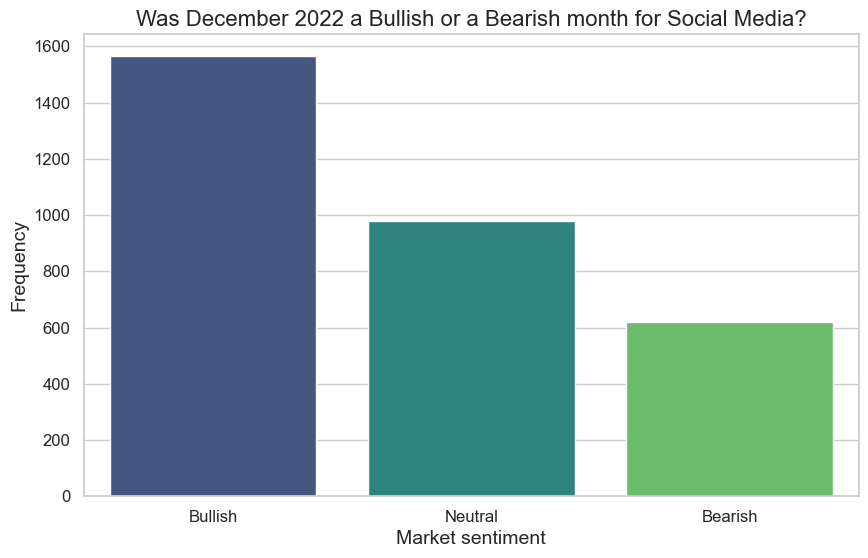

In [30]:
import seaborn as sns
sentiment_counts = df_btc_sentiment['sentiment_label'].value_counts()

# Creating a bar plot
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.barplot(x=sentiment_counts.index, y=sentiment_counts.values, palette="viridis")

plt.xlabel('Market sentiment', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.title('Was December 2022 a Bullish or a Bearish month for Social Media?', fontsize=16)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()


###### As you can see the analyzed tweets have a mostly BULLISH (positive) sentiment.

### Web-scraping Bitcoin price history

In [41]:
from bs4 import BeautifulSoup
import requests

In [44]:
url = "https://www.statmuse.com/money/ask/what-is-the-average-price-of-bitcoin-in-dec-2022"

In [45]:
response = requests.get(url)
response.status_code

200

In [47]:
#Creating the soup
soup = BeautifulSoup(response.content, 'html.parser')

In [50]:
print (soup.prettify())

<!DOCTYPE html>
<html lang="en">
 <head>
  <meta charset="utf-8"/>
  <meta content="light only" name="color-scheme"/>
  <meta content="width=device-width, initial-scale=1.0" name="viewport"/>
  <meta content="Astro v3.5.5" name="generator"/>
  <meta content="app-id=1234654160" name="apple-itunes-app"/>
  <title>
   What Is The Average Price Of Bitcoin In Dec 2022 | StatMuse Money
  </title>
  <meta content="The average closing price for Bitcoin (BTC) in December 2022 was $16,949.61. It was down 3.6% for the month. The latest price is $43,095.62." name="description"/>
  <meta content="StatMuse, finance, financial information, finance search, stocks, money, Bitcoin, gold, currencies, markets, FX, stock prices, bitcoin prices, stock returns, Bitcoin returns, currency pairs, index funds, ETFs, BTC, USD, EUR, GBP, NASDAQ stocks, NYSE stocks" name="keywords"/>
  <meta content="915991831757165" property="fb:app_id"/>
  <meta content="StatMuse" property="og:site_name"/>
  <meta content="What I

In [52]:
all_rows = soup.find_all('tr')

In [55]:
# Initializing a list to hold the data
data = []
# Looping through all rows and check if they belong to December 2022
for row in all_rows:
    date_cell = row.find('td', attrs={"data-value": True})
    if date_cell and '2022-12' in date_cell['data-value']:
        open_price_cell = date_cell.find_next_sibling('td')
        if open_price_cell:
            open_price = open_price_cell.get_text(strip=True)
            date = date_cell.get_text(strip=True)
            data.append({'Date': date, 'Open Price': open_price})

In [74]:
# Let's create a DataFrame from the data
df = pd.DataFrame(data)

df

,Date,Open Price
0,December 31 2022,"$16,603.67"
1,December 30 2022,"$16,641.33"
2,December 29 2022,"$16,552.32"
3,December 28 2022,"$16,716.40"
4,December 27 2022,"$16,919.29"
5,December 26 2022,"$16,842.25"
6,December 25 2022,"$16,847.51"
7,December 24 2022,"$16,796.98"
8,December 23 2022,"$16,829.64"
9,December 22 2022,"$16,818.38"


In [78]:
import matplotlib.dates as mdates
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date')
df.reset_index(drop=True, inplace=True)
df

,Date,Open Price
0,2022-12-01,"$17,168.00"
1,2022-12-02,"$16,968.68"
2,2022-12-03,"$17,090.10"
3,2022-12-04,"$16,908.17"
4,2022-12-05,"$17,128.89"
5,2022-12-06,"$16,975.24"
6,2022-12-07,"$17,089.51"
7,2022-12-08,"$16,847.35"
8,2022-12-09,"$17,232.15"
9,2022-12-10,"$17,134.22"


In [82]:
#let's inspect the 'Open Price' column
print(df['Open Price'].dtype)

object


In [84]:
df['Open Price'] = df['Open Price'].replace('[\$,]', '', regex=True)
df['Open Price'] = df['Open Price'].astype(float)
df.dtypes

Date          datetime64[ns]
Open Price           float64
dtype: object

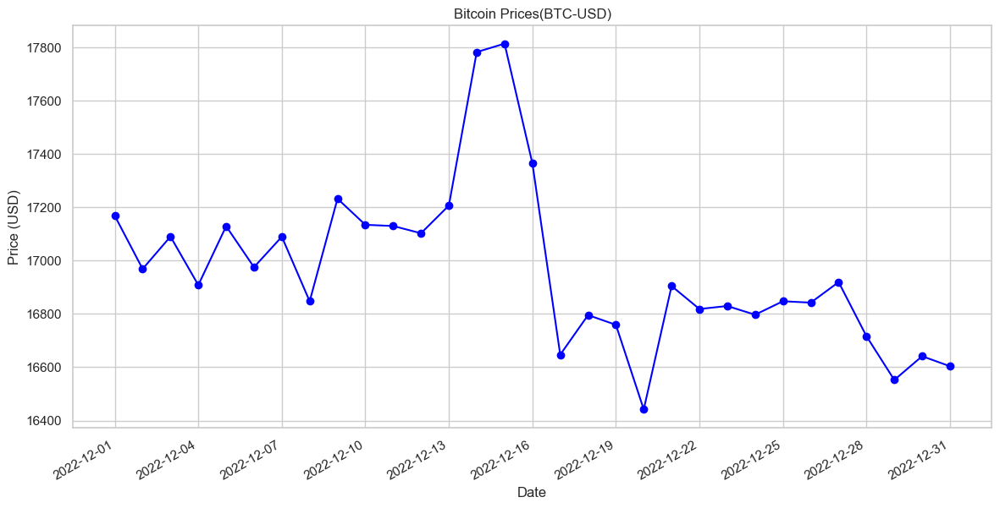

In [86]:
# Plotting the data
plt.figure(figsize=(14, 7))  
plt.plot(df['Date'], df['Open Price'], marker='o', linestyle='-', color='blue')

plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=3))  
plt.gcf().autofmt_xdate()

plt.title('Bitcoin Prices(BTC-USD)')
plt.xlabel('Date')
plt.ylabel('Price (USD)')

plt.grid(True)

plt.show()

###### As you can see, the overall "Bullish" sentiment on social media about Bitcoin doesn't translate to a good reaction of the market. Bitcoin price experience a slight reduction over the month of December 2022